# Project Notebook Introduction

Welcome to the main project notebook! 

## What is the goal of this notebook?

This notebook should contain your project write-up and the analyses conducted on the provided data. For each project, the notebook provides links to a few articles on the subject of the notebook, and a few examples of analyses that you could/should do. But it is not at all exhaustive: If you need to install more python packages or other software, do so. If you want to search for additional literature to support your writing, do so!

Your goal is to work from these examples towards answering the list of questions specific to each of the projects, and write a coherent report following the structure at the bottom of this notebook. Your colleagues (and I) will read and grade the result. So, make sure that you provide ample and adequate descriptions of your results and methodologies. This notebook is likely going to get rather large as you add analyses, so best to use markdown cells and headings to create a table of contents structure, as you can see in the ToC menu on the left of the Colab user interface.  

If this project feels a bit open-ended, that's because it is - just like actual research! ***But you are not alone!*** You will collaborate with your fellow students in your group! I also want to push you towards asking any and all questions in the canvas discussions, and directly to me via email and the Friday Zoom meetings. I'm here to help, and will give hints if you ask me the right questions. 

You are free to make this as beautiful and far-reaching as you feel like. But keep track of time, you will need to finish this the week before the exam. Perfect is the enemy of good, beware. 


## Installation etc.

The first part of this notebook is shared across the different projects, as the notebook will download the data for all the projects in the same way. 

The first installation and setup cells may take a little while to run as they fetch and install all the required software. It's also likely there's going to be a LOT of outputs that are irrelevant. Feel free to delete the output of this cell after it runs to free up space. 

In [ ]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex



Extracting templates from packages: 100%
     |████████████████████████████████| 10.1 MB 5.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

### Download of data: surfaces for plotting and project data

Both the surface data we'll use for visualization and the project fMRI data are on figshare. From Figshare, we can download the data and place them in the Colab virtual machine. You don't have to read/understand this code - it's all boilerplate stuff to set up Colab's virtual machine so that it works with our data. 

***More important:*** For a brief description of the data of the different projects, --and a couple of very important parameters of these acquisitions which you will need later-- please consult the [figshare website](https://figshare.com/articles/dataset/fMRI_Teaching_Materials/14096209)

In [ ]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
#!unzip -qq /content/pycortex/db/hcp_999999.zip -d /content/pycortex/db/
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /usr/share/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 23889, done.
remote: Counting objects: 100% (2293/2293), done.
remote: Compressing objects: 100% (785/785), done.
remote: Total 23889 (delta 1533), reused 2151 (delta 1449), pack-reused 21596
Receiving objects: 100% (23889/23889), 476.16 MiB | 22.56 MiB/s, done.
Resolving deltas: 100% (18215/18215), done.
Checking out files: 100% (529/529), done.


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

## Putting these tools to first use

Ok, why all this complicated hassle? Well, we want you to have a playground that allows you to really get to know the data. 

#### Where are the data files?

The data have now been downloaded, and you can check out the data on disk by using the command line. For example, in a code cell you can preface the line with an exclamation mark to give a commandline command: 

`!ls /content/data/prf_mapper_59k`

Will give you the contents of the prf experiment data folder. But, on the left in the CoLab UI you can also find a file navigator, next to the table of contents, search and code snippet elements. Feel free to have a look around!

#### Okay, but what can we do with these tools?

After downloading and auto-editing the data required for working with pycortex, we can now import pycortex. We'll use pycortex for plotting of the results, which is using only a subset of its awesome features. Remember that [brain viewer of semantic maps](http://gallantlab.org/huth2016/)? Also made using pycortex! If you have some spare time and want to play around with this awesome package, please have a look at the [pycortex docs](https://gallantlab.github.io/pycortex/)

In [ ]:
!ls /content/data/soma_mapper_59k

__MACOSX
sub-01_ses-01_task-soma_run-median_events.tsv
sub-01_ses-01_task-soma_run-median_space-59k_hemi-L_sg_psc.dtseries.gii
sub-01_ses-01_task-soma_run-median_space-59k_hemi-R_sg_psc.dtseries.gii
task-soma_bold.json


In [ ]:
import cortex as cx

And, just to highlight the type of visualisation we'll be doing, a quick demo of the way we'll be using it. We'll be using the surface from the Human Connectome Project, which we named `hcp_999999`. So that's the 'subject' name we use to get and plot surface data using pycortex. 

Don't worry if you see a bunch of warnings and stuff - it will create the figure we asked for from what is in essence a single line of code: the curvature of the cortical surface of this standard surface. **Gorgeous!** 

Feel free to change the datatype to `'thickness'`, for example. Also **Gorgeous!**

Generating a flatmap cache
Failed to get connection
** (inkscape:3165): CRITICAL **: 16:06:26.514: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3165): CRITICAL **: 16:06:26.514: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3165): CRITICAL **: 16:06:26.514: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


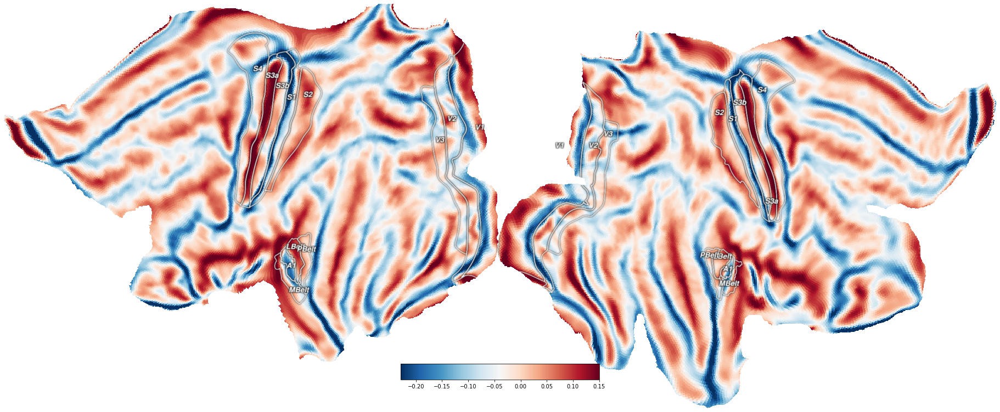

In [ ]:
curv_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='curvature')
cx.quickshow(curv_vertices);

### Flatmaps?

But what the hell are we looking at, even? The cortical surface or ribbon is topologically a ball per hemisphere. That is, each hemisphere can be inflated to the shape of a sphere (let's not get stuck on the question how a hemisphere can also be a sphere :-) ). Flatmaps are created by cutting the inflated cortical surface at specific locations (see the black lines in the left figure), and then letting the computer flatten the resulting mesh into a planar surface. 

<img src="https://github.com/VU-Cog-Sci/wiki/raw/master/imgs/flatten/image9.png" alt="where do we cut the surface" width="45%" style="align:left;"/> <img src="https://universe-review.ca/I10-13-BrainMap3.jpg" alt="Visual, auditory and somatosensory brain regions" width="45%" style="align:right;"/>

This flatmapping has the advantage that we can view the entire cerebral cortex in one fell swoop, but the downside is that it is hard to orient yourself to where things are. That's why we've added some lines that surround certain labeled regions of interest - they are the visual, auditory and somatosensory/motor cortex. In the right image they are the blue, red and green areas of the brain, respectively. We're using exactly the flattened surfaces of the right column in the right figure, but ours are rendered side-by-side. Recognize them from the curvature figure?

Take a few minutes to orient yourself on these surfaces, using the atlas in the right figure. Where are the darker areas of this atlas on the inflated surfaces, and where do they end up on the flattened surface? Same for the coloured regions - make sure you have an idea of where things are. This will greatly increase your maneuverability in the brain. 

You'll need that maneuverability because we'll be working with surface data in this project: all the data you will load is surface-based, and should be visualized as shown in this introduction. In many ways, surface-based fMRI data is simpler than volume-based data. Instead of 4-dimensional, it's 2-dimensional: vertices by timepoints. This makes it less of a bookkeeping hassle to use. Let's have a look at some of your fMRI time-course data!


## Loading the functional data for your project

In the cell below we're loading the functional MRI files you'll be working with. There's a different set of files that you open and read depending on the project that you'll be doing. Once loaded, though, all of these datasets have the same format - they're all formatted for the same surface that you've already plotted data into. 

In [ ]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 
# There are 3 separate versions here, one for each project-dataset.


#########################################################################################################
###############
############### pRF mapping data
###############
#########################################################################################################

# tseries_raw = np.nan_to_num(np.concatenate([load_surf_data(
#         os.path.join('/content/data/prf_mapper_59k', f'sub-02_task-prf_space-59k_hemi-{hemi}_run-median_desc-bold.func.gii'))
#          for hemi in ['L', 'R']]))

#########################################################################################################
###############
############### somatotopic mapping data
###############
#########################################################################################################

tseries_raw = np.concatenate([load_surf_data(
        os.path.join('/content/data/soma_mapper_59k', f'sub-01_ses-01_task-soma_run-median_space-59k_hemi-{hemi}_sg_psc.dtseries.gii'))
         for hemi in ['L', 'R']])

#########################################################################################################
###############
############### hrf mapping data
###############
#########################################################################################################

# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 141)


## Raw Data Observations
### What amount of preprocessing has already been done?

If the signals have been filtered already, there should be no drifts in the data. Also, if the data time-courses have already been z-scored or converted to percent signal change, the mean of the signals should already be 0. If the data are in 'units' of % signal change, the maximal excursions of the signal timecourse will be on the order of 10-20. If they've been z-scored, their standard deviation should be exactly 1 (duh!). 

Like we learned in the preprocessing lecture and practical, the standard deviation over time also gives us a lot of valuable information regarding signal quality in non-z-scored data. Let's have a quick look at these different aspects of the data on flatmaps. This will also show us whether we were scanning the whole brain or not - an aspect of the data acquisition that you may want to mention in your report...

**Note**
If we plot data that didn't come from pycortex's surface data itself, but from our own files, we need to supply a subject. Adding the colormap is just for clarity. 

Failed to get connection
** (inkscape:3173): CRITICAL **: 16:06:32.215: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3173): CRITICAL **: 16:06:32.215: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3173): CRITICAL **: 16:06:32.215: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3176): CRITICAL **: 16:06:33.698: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3176): CRITICAL **: 16:06:33.698: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3176): CRITICAL **: 16:06:33.698: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


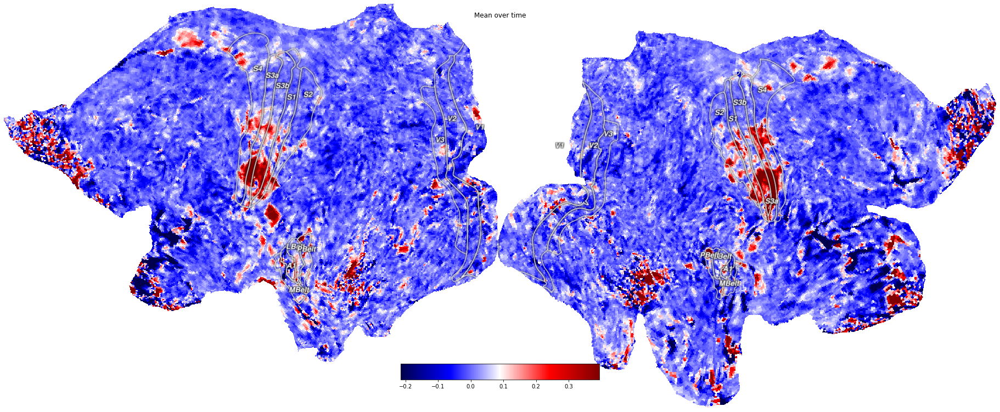

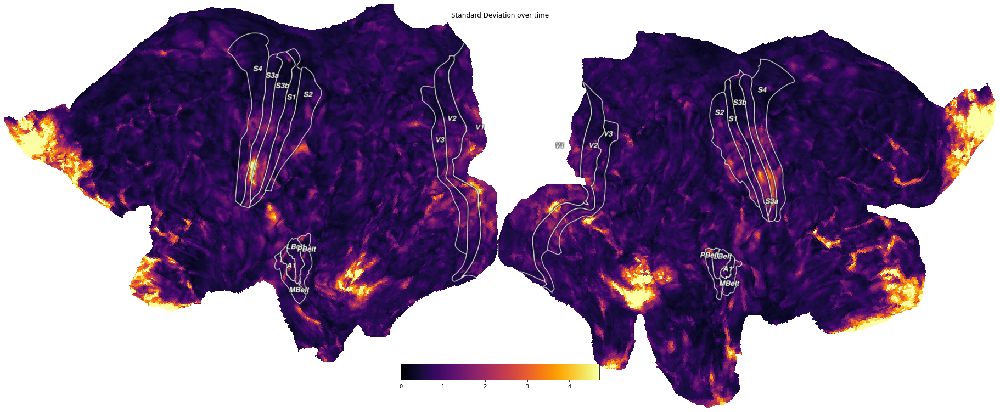

In [ ]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

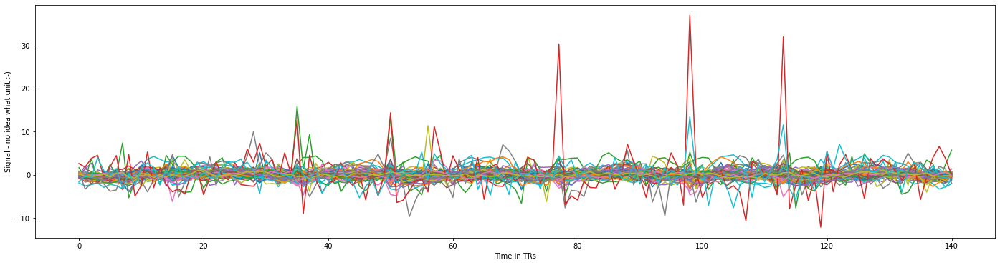

In [ ]:
# now, let's get some random time-courses to check whether there's still drift:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');

In [ ]:
tseries_raw.shape

(118584, 141)

Now, depending on your dataset you may see that the top of the brain is brighter than the bottom. This is due to the fact that the top of the brain is closer to the coils. Moreover, you may see some really interesting web-like pattern on the surfaces that you've plotted. Like this:

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/lqPTAzK.png" alt="Model pipeline" width="500" align="right" />

What is that stuff? Why isn't it homogeneous? The answer is, we're looking at blood, and at 7 Tesla (at which all these data were acquired) these veins show up very strongly. Their presence has a strong influence on whether you can find any 'activation', as they may get in the way of what you want to find. Keep this in mind!

### Questions concerning signal quality

From these simple surface and time-course plots above, we can immediately gather a couple of things. Try to answer the following questions from both the flatmaps and the random time-courses. 

1.   have these data been z-scored or percent signal changed? **Check the colorbars!** What would they look like if they'd been z-scored?

**Answer**: They have not been standardized, only de-meaned! If they had been standardized, the std deviation of each of the signals would have been exactly 1! See below the code that shows the answer!

2.   have these data been high-pass filtered? **Check the timecourses!**

**Answer**: Yes, they have been high-pass filtered! There is no drift visible.

3.   where do you see the biggest signal fluctuations? What are the likely origins of these fluctuations? 

**Answer**: Biggest fluctuations in the sensory motor cortex and the frontal lobe which itself is associated in voluntarily movements! 
You can use these insights in writing the data description section of your report! Note that there are differences between the different project-datasets, so make sure you inspect your own!

<font color='red'>-- Important: --</font>

**Your conclusions about the state of the data for your project will tell you what to do: you now have to decide whether to perform additional preprocessing, such as temporal filtering, percent signal change conversion, etc.**

In [ ]:
# Check if the standard deviation of each of the time course is 1 

np.nanmean(np.std(tseries_raw, axis = 1), axis = 0)

0.8952939

In [ ]:
np.isnan(tseries_raw).sum()

1535067

In [ ]:
tseries_raw.shape[0]

118584

In [ ]:
count = 0
first_occurence ={}
for i in range(0,tseries_raw.shape[0]):
  count += np.isnan(tseries_raw[i]).sum()
  if np.isnan(tseries_raw[i]).sum() >0:
    first_occurence[i] = np.isnan(tseries_raw[i]).sum()

We have a lot of nan valus. Is that because we have an array of equal size for each voxel that

In [ ]:
unique, counts = np.unique(tseries_raw, return_counts = True)
unique
counts

array([      1,       1,       1, ...,       1,       1, 1535067])

In [ ]:
a = np.std(tseries_raw, axis=1)
unique, counts = np.unique(a, return_counts = True)

counts

array([    1,     1,     1, ...,     1,     1, 10887])

## Atlas tools

It's a very powerful thing to be able to plot stuff on the entire cerebral cortex in one go. But sometimes you want to focus on a single brain region. You can use your own methods to define regions of interest, for example using a separate mapper experiment that allows you to select voxels/vertices of interest - within which you'll then perform your analysis of interest. 

But we'll use the existing multi-modal parcelation atlas from the Human Connectome Project, from the [Glasser et al Nature study](https://www.nature.com/articles/nature18933) that was mentioned a couple of times in the lectures. This is the atlas shown in the right flatmap figure above, in the 'Flatmaps' section.

The following cells show how to select a given ROI's data - something that you may want to do quite a lot in your own analyses. It serves to zoom into a specific region of interest, but also means that you can 'pilot' time-consuming analyses on smaller amounts of data while still taking care to test your entire analysis. 

In [ ]:
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)

In [ ]:
atlas_data_both_hemis == 1
len(atlas_data_both_hemis)

118584

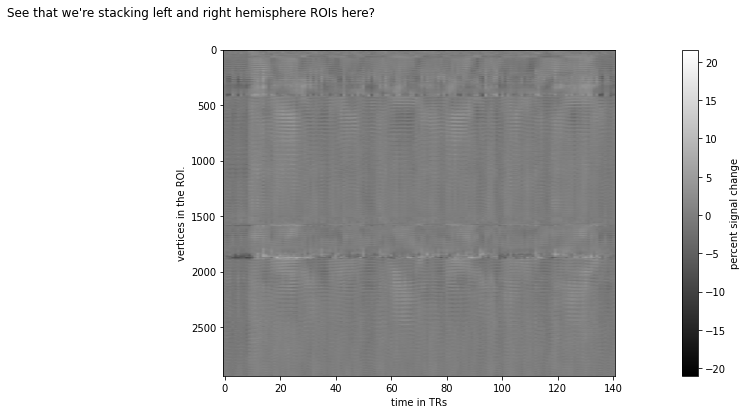

In [ ]:
roi_boolean_mask = atlas_data_both_hemis == 1

# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

f = plt.figure(figsize=(24,6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");

To help you out a bit, here's a dictionary that gives you the indices in the atlas for the regions that are outlined in the flatmaps. This may help you find your way later on :-)

In [ ]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

**Units**

Because of the organization of the visual system, we'll now want to convert the parameters of the best-fitting model from x0 and y0 to eccentricity and polar angle, as you saw in the Dumoulin 2008 paper. The functions to do this are given below: 

In [ ]:
# But working with polar coordinates is a bit hairy.
# The easiest way to go is through complex numbers. 
# you don't need to understand the following completely, 
# but you can use the code. It will also take arrays for 
# x0 and y0.

def angle(x0, y0):
    return np.angle(x0 + y0 * 1j)

def ecc(x0, y0):
    return np.abs(x0 + y0 * 1j)

To plot polar angle on the surface, you should use a circular colormap because phase is a circular measure. Please see the pycortex website for a collection of colormaps: https://gallantlab.github.io/pycortex/colormaps.htm

# Project 2: Soma-Mapper

This section will explain the experiment, background and analysis plans for the Soma-mapper dataset.  You should feel free to use any and all information in this "Project Explanation" section in your own report. Before going through this section, though, read the following relevant articles: [New Whole-Body Sensory-Motor Gradients Revealed Using Phase-Locked Analysis and Verified Using Multivoxel Pattern Analysis and Functional Connectivity, Zeharia et al, 2015](https://www.jneurosci.org/content/jneuro/35/7/2845.full.pdf), and [The ‘creatures’ of the human cortical somatosensory system, Saadon-Grosman et al, 2020](https://academic.oup.com/braincomms/article/2/1/fcaa003/5709029). If you have any questions about the type of experiment we're going to be looking at, and the different analysis steps, please ask me.

<img style="float:left; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/8P79rY0.png" alt="Model pipeline" width="500" align="left" />

## Somatotopic Mapper: the Experiment. 

This experiment was conducted by Ines, the course TA, for her PhD project. It's a motor mapper - and not a somatosensory mapper like in one of the original articles - that served to map out the subject's motor strip in the central sulcus. 

Subjects viewed a movie of an avatar that moved its facial muscles, hands and legs in a quasi-cyclic order that was identical across runs. On some cycles subjects moved both hands/legs, and on some they only moved one side. With a design like this we can investigate and chart not just the lateralized motor map, but also whether responses in for example the right-hand region are similar when we move the right hand, or both. You can see example timecourses from two voxels; one from the hand and one from the face. There are even [studies reporting pRF-like analyses](https://www.sciencedirect.com/science/article/pii/S105381191830569X) (see the pRF project if you want to know more) on experiments such as these. But for now, we won't be going there. 

The data that we will analyze here is the average across 5 runs for a single subject. We don't want to be "scraping the bottom of the barrel", so using this averaged data means that it is very high-signal data, and we can go into detail a bit. We will analyze these data using a 'standard' GLM, and will then inspect the sensitivities along the central sulcus. **Can we find the hand-, leg-, and face regions of the motor cortex? Let's find out!**



## Experimental Design

This experimental design is a blend between an event-related and a block design. We can find what happened when on the screen by inspecting what's in the `events.tsv` file. Files like this are standard BIDS formatted meta-data, that allow other researchers to immediately understand what we did (with the explanations in the paper, of course). 

Let's see if we can make sense of this. 

In [ ]:
import pandas as pd
expt_df = pd.read_csv('/content/data/soma_mapper_59k/sub-01_ses-01_task-soma_run-median_events.tsv', sep='\t')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(expt_df)

    Unnamed: 0       onset  duration   trial_type
0            0   11.988714  2.250143     eyebrows
1            1   15.335506  2.251704         eyes
2            2   18.689733  2.250188        mouth
3            3   22.034835  2.250071       tongue
4            4   25.376571  2.254236  lhand_fing1
5            5   28.709952  2.255005  lhand_fing2
6            6   32.043396  2.250697  lhand_fing3
7            7   35.385158  2.250085  lhand_fing4
8            8   38.718646  2.250125  lhand_fing5
9            9   42.047893  2.251309         lleg
10          10   45.381301  2.250129     eyebrows
11          11   48.723160  2.250189         eyes
12          12   52.064872  2.250075        mouth
13          13   55.406608  2.250088       tongue
14          14   58.744236  2.254844  lhand_fing1
15          15   58.744236  2.254844  rhand_fing1
16          16   62.077651  2.250104  lhand_fing2
17          17   62.077651  2.250104  rhand_fing2
18          18   65.411134  2.250754  lhand_fing3


### Experimental timecourse

This provides quite a complete description of what happened when. For example, you see that events on lines 14 and 15 occurred simultaneously; both hands were moved at this point in time. But event nr 4 was just the left hand's finger 1 moving.  

With this information we can start to construct our design matrix. The idea here is exceedingly similar to our earlier notebook practicals (so you'll be able to re-use a lot of things that you've learned there), but now our design is a bit more complicated. But, we're also more experienced scientists so we'll be fine. Let's get going. 

In [ ]:
# what types of stimuli were shown, and what bodyparts were actually moved?
unique_event_types = np.unique(expt_df['trial_type'])
print(unique_event_types)

['eyebrows' 'eyes' 'lhand_fing1' 'lhand_fing2' 'lhand_fing3' 'lhand_fing4'
 'lhand_fing5' 'lleg' 'mouth' 'rhand_fing1' 'rhand_fing2' 'rhand_fing3'
 'rhand_fing4' 'rhand_fing5' 'rleg' 'tongue']


In [ ]:
# what types of stimuli were shown, and what bodyparts were actually moved?
unique_event_types = np.unique(expt_df['trial_type'])
print(unique_event_types)

# let's order these in a sensible way so that when we decide to loop over them, 
# it's easy to keep in mind what we're doing
unique_event_types = ['eyebrows', 'eyes', 'mouth', 'tongue', 'lhand_fing1', 'lhand_fing2', 'lhand_fing3', 'lhand_fing4', 'lhand_fing5', 'lleg',  'rhand_fing1', 'rhand_fing2', 'rhand_fing3',
 'rhand_fing4', 'rhand_fing5', 'rleg']

# so, we can use the pandas DataFrame 
# to easily take the event times for an example event type
# you can use this simple syntax yourself later on
event_times = np.array(expt_df[expt_df['trial_type'] == 'rhand_fing2']['onset'])
event_times

['eyebrows' 'eyes' 'lhand_fing1' 'lhand_fing2' 'lhand_fing3' 'lhand_fing4'
 'lhand_fing5' 'lleg' 'mouth' 'rhand_fing1' 'rhand_fing2' 'rhand_fing3'
 'rhand_fing4' 'rhand_fing5' 'rleg' 'tongue']


array([ 62.07765055,  95.42452204, 168.97256398, 202.53610504])

In [ ]:
tseries_raw.shape

(118584, 141)

In [ ]:
tseries_raw.shape[1]*1.6*10

2256.0

(0.0, 220.0)

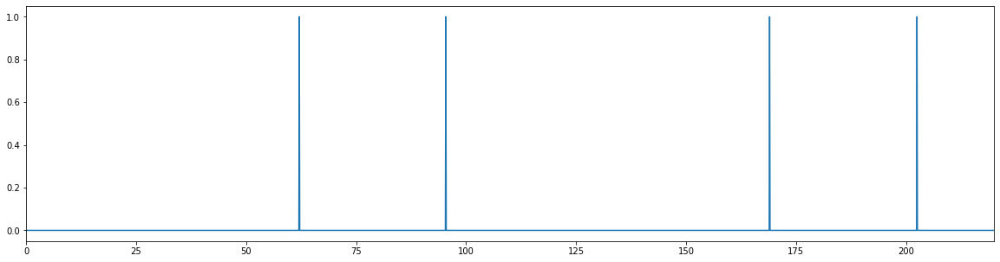

In [ ]:
tr = 1.6
upscaled_times = np.arange(0, tseries_raw.shape[1]*tr, 0.1)
neural_event_timecourse = np.zeros(int(tseries_raw.shape[1]*tr*10))
neural_event_timecourse[np.round(event_times * 10).astype(int)] = 1

f = plt.figure(figsize=(20,5))
plt.plot(upscaled_times, neural_event_timecourse, label='neural')
plt.xlim(0,220,1)



/usr/local/lib/python3.7/dist-packages/nilearn/glm/__init__.py:56: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  'It may change in any future release of Nilearn.', FutureWarning)


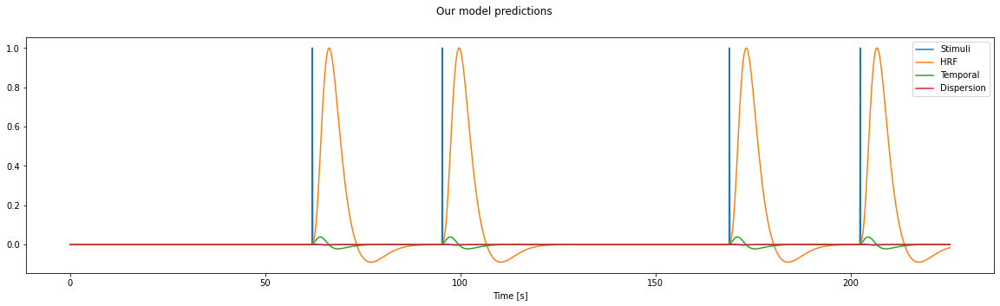

In [ ]:
# okay, now that we have event times, we'll be able to create a fine-timing timecourse. 
# I will tell you a secret: the TR in this experiment was 1.6s - you can find this info
# in the figshare website also. 
tr = 1.6

# create 0.1 s timescale regressor, and fill in the events
upscaled_times = np.arange(0, tseries_raw.shape[1]*tr, 0.1)
neural_event_timecourse = np.zeros(int(tseries_raw.shape[1]*tr*10))
# we'll pretend the events were instantaneous, since this will not
# impact the expected response shapes much
neural_event_timecourse[np.round(event_times * 10).astype(int)] = 1 

from nilearn.glm.first_level.hemodynamic_models import _gamma_difference_hrf

hrf = _gamma_difference_hrf(tr=tr ,oversampling=16, onset=-tr/2)
hrf /= hrf.max() # <- normalize HRF

#Add here temporal and dispersion functions
sg_hrf_temp = np.diff(hrf)
sg_hrf_disp = np.diff(sg_hrf_temp)

#We need to add the values that we lost due to 
sg_hrf_temp = np.append(sg_hrf_temp, 0)
sg_hrf_disp = np.append(sg_hrf_disp, [0, 0])

bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]
predictor_hrf_temporal = np.convolve(neural_event_timecourse, sg_hrf_temp, 'full')[:neural_event_timecourse.shape[0]]
predictor_hrf_dispersion = np.convolve(neural_event_timecourse, sg_hrf_disp, 'full')[:neural_event_timecourse.shape[0]]

f = plt.figure(figsize=(20,5))
plt.plot(upscaled_times, neural_event_timecourse, label='neural')
plt.plot(upscaled_times, bold_event_timecourse, label='BOLD')
plt.plot(upscaled_times, predictor_hrf_temporal, label = 'Temporal derivative hrf')
plt.plot(upscaled_times, predictor_hrf_dispersion, label = 'Temporal dispersion hrf')
plt.legend(['Stimuli','HRF', 'Temporal', 'Dispersion'])
plt.suptitle('Our model predictions')
plt.xlabel('Time [s]');

In [ ]:
bold_event_timecourse.shape

(2256,)

## First GLM 

Now that we've got a single-regressor design matrix, we can start to perform a GLM analysis on the brain. We'll first look at explained variance and beta weights to get an idea of whether this all makes sense. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  


Failed to get connection
** (inkscape:3184): CRITICAL **: 16:06:55.299: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3184): CRITICAL **: 16:06:55.301: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3184): CRITICAL **: 16:06:55.301: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3187): CRITICAL **: 16:06:56.740: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3187): CRITICAL **: 16:06:56.740: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3187): CRITICAL **: 16:06:56.740: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


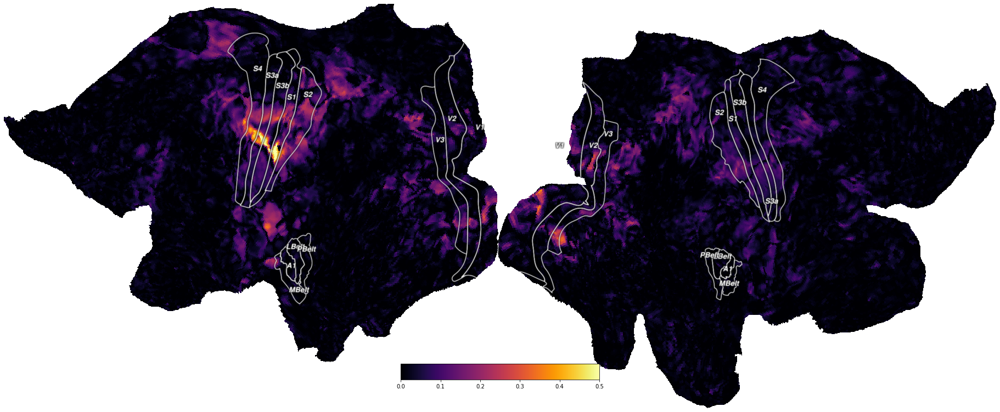

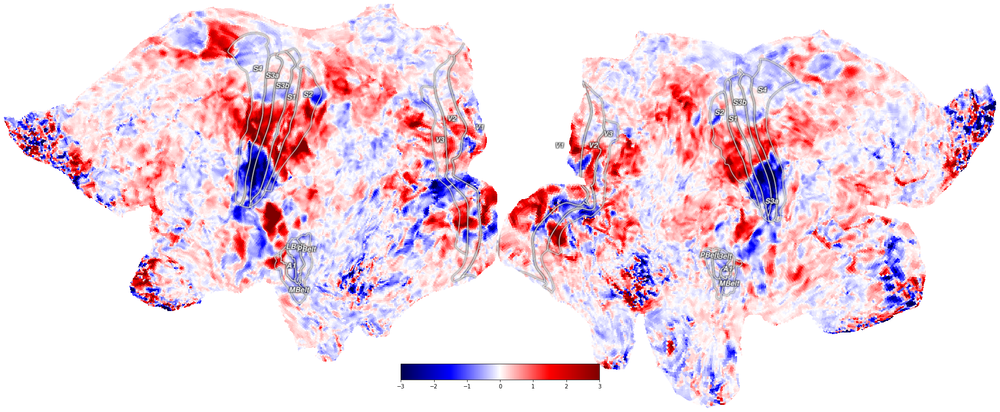

In [ ]:
sub_sampled_regressor = bold_event_timecourse[::16]
dm = np.vstack([np.ones_like(sub_sampled_regressor), sub_sampled_regressor]).T

betas, _, _, _ = np.linalg.lstsq(dm, tseries_raw.T)
# let's look at betas[1], since those are our tongue betas 

yhat = np.dot(betas.T, dm.T)
rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

# we can visualize the rsq and beta weights separately
f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=0.5));

masked_betas = betas[1]
# masked_betas[rsq < 0.3] = np.nan

f2 = cx.quickshow(cx.Vertex(masked_betas, subject='hcp_999999', cmap='seismic', vmin=-3, vmax=3, alpha=rsq));

# or use one to mask the other using a 2D Vertex object, and plotting that. 
# there seems to be a rendering issue, but we'll leave it at this.
# f12 = cx.quickshow(cx.Vertex2D(rsq, betas[1], subject='hcp_999999', cmap='BuWtRd_alpha', vmin=0.1, vmax=1, vmin2=-3, vmax2=3));

## More complete GLM

OK, now that we're starting to see that we can find something going on in motor cortex (and get positive and negative beta weights), we need to run a full GLM with all event types simultaneously encoded in the design matrix. 

You see, there's a conceptual problem with running all of these regressors in separate GLMs, and you can see from this last figure. We used the right hand finger regressor, but we also see right (and not contralateral left) give a similar if fainter pattern of BOLD responses. From the earlier explanations you should be able to answer the question: _"Why is that?"_

In any case, we'll need to perform an actual GLM to get around this problem, so that is what we'll do. Our first task is to convert the above code into a function that creates the regressors and cleans things up a bit. For further code that you'll write yourselves, follow this example: if things become more complicated in terms of analysis it often helps to provide more structure in your code. 

eyebrows
eyes
mouth
tongue
lhand_fing1
lhand_fing2
lhand_fing3
lhand_fing4
lhand_fing5
lleg
rhand_fing1
rhand_fing2
rhand_fing3
rhand_fing4
rhand_fing5
rleg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


Failed to get connection
** (inkscape:3193): CRITICAL **: 16:07:07.242: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3193): CRITICAL **: 16:07:07.242: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3193): CRITICAL **: 16:07:07.242: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


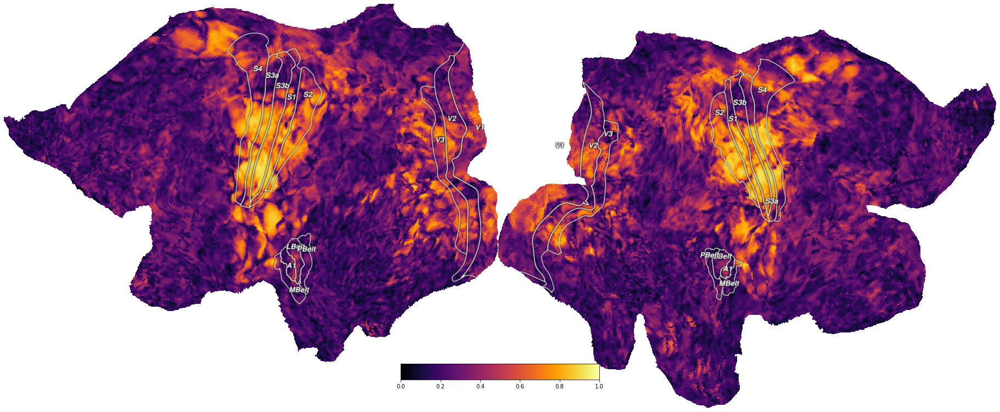

In [ ]:
def create_BOLD_regressor(event_times, n_timepoints, tr=1.6, supersampleratio=10):

    # create 0.1 s timescale regressor, and fill in the events
    upscaled_times = np.arange(0, n_timepoints*tr, 1/supersampleratio)
    neural_event_timecourse = np.zeros(int(n_timepoints*tr*supersampleratio))
    # we'll pretend the events were instantaneous, since this will not
    # impact the expected response shapes much. For events with variable durations
    # you'll want to make sure this doesn't happen :-)
    neural_event_timecourse[np.round(event_times * supersampleratio).astype(int)] = 1 

    hrf = _gamma_difference_hrf(tr=tr ,oversampling=tr*supersampleratio, onset=-tr/2)
    hrf /= hrf.max() # <- normalize HRF

    bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]
    sub_sampled_regressor = bold_event_timecourse[::int(tr*supersampleratio)]
    return sub_sampled_regressor

def create_design_matrix(regressor_types, expt_df, data):
    regressors = [np.ones(data.shape[1])]
    for regressor_type in regressor_types:
        event_times = np.array(expt_df[expt_df['trial_type'] == regressor_type]['onset'])
        regressors.append(create_BOLD_regressor(event_times, data.shape[1]))
    return np.array(regressors)

dm = create_design_matrix(regressor_types=unique_event_types, expt_df=expt_df, data=tseries_raw)

betas, _, _, _ = np.linalg.lstsq(dm.T, tseries_raw.T)
yhat = np.dot(betas.T, dm)

rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1));

## Some interpretation.

Boom, that's a lot of explained variance in different parts of the brain! We're plotting the proportion of within-set explained variance of the GLM analysis up there. What does this pattern mean? There is a clear pattern around the central sulcus. But a few other things seem to 'light up' too. Some of these correspond to known somatotopy like the maps we know from the papers we've read. 

**But others don't. Can you identify these and explain why we do see them here?**

*The visual areas are activated because the participants are observing an example on the screen*

You will likely see these weird regions pop up in later requested analyses, too. Your interpretation is essential here, and should be reflected in your writing of the report. Also, don't forget to mention your choices in terms of preprocessing. 

## Your task

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/Hj9spSs.png" alt="Homunculus" width="600" align="right" />

The nice part about these maps is that they give us something to hold on to - we know that we should be seeing them, we know that our bodies are represented contralaterally, and we know that there should be a set of somatotopic gradients. But how exactly do they run in this subject? For example, as you see, the ordering of the fingers on the Homunculus maps to the right are a bit ambiguous. Also, in much of the preceding literature such as the Zeharia study linked to above, the data were quite strongly smoothed. We're not doing that here, because it would diminish our spatial detail. Keep in mind that we're likely going to be looking at more detailed gradients than you see in those older studies. 

**Diving into the map structure of somatotopic cortex is your task for this project report.** Create the following visualizations:

1. Show the T-statistic of the contrast of "right hand" vs "left hand" to signify contralaterality of the hand representations. This should give you a broad idea of where the hand representation is in our S-named regions of interest (the ones that are green in the HCP flatmap explanation above). Use your knowledge from the glm practical to calculate these statistics, and use a t-statistic threshold of 4 in your visualizations. Do the same for the left foot vs the right foot. 
2. Then, contrast the face vs an implicit baseline (an unbalanced contrast)
    - Is the very coarse map of faces, hands, and feet we're seeing until now contiguous on the surface? Or are there some holes? If not, why do you think this is the case? Can you tie this back to the different regressors we have in our design?
3. Now, subdivide the hand into its fingers, and test the left vs right contrast for each finger. For this analysis, create 5 separate flatmaps. 
4. But how are these ordered? Kind of hard to see now, with these separate figures. In the end, we want to create the actual somatotopic gradient on the surface! This is what we'll do. 
    - The first step is to figure out the winning finger for each voxel - use `np.argmax` for this. 
    - Now, re-code this such that you create a finger-line, running as follows: `[-5, -4, -3, -2, -1, 1, 2, 3, 4, 5]`. That is, from the left pinky to thumb and then from the right thumb to pinky. Set everything outside the hand regions you found in the previous analysis to `0` or `np.nan`. Now, visualize this using the `CyanBlueGrayRedPink`, `nipy_spectral`, or `J4` colormaps to bring about the finger maps on the surface. Or, if you come up with your own coloring, by all means go ahead! Is this map monotonic? In your report, you should relate these qualities of the map to the literature we gave you, and literature that you've discovered yourself.
    - In this experiment, subjects' movements would also have produced sensations. This means it's likely that you'll see these maps both in somatosensory AND motor cortex. In the Homunculus figure shown to the right here, there are slight differences between the two. Do your findings replicate this?
5. Lastly, what about the face? Create a similar gradient representation of the face, top to bottom. What part of the face is most strongly represented? Is the resulting map monotonic? Again, what have you found about this map in the literature?
6. **bonus** Oftentimes, neural tuning isn't about just the peak tuning location, but also the width of the tuning function. Specifically, we'd expect the tuning width to broaden as we move away from the primary regions towards more high-level regions. Can you think of a way to quantify this 'tuning width' for this experiment? And if so, can you plot this on the surface, as well as for different ROIs? 
7. **bonus** **bonus** Perhaps you guessed it, you could answer question [6.] if you fit a somatotopic pRF model to the data, exactly according to how [this paper](https://www.sciencedirect.com/science/article/pii/S105381191830569X) did it. That is, you can try to fit the soma-pRFs using the `gauss1D_cart` function below, on the beta values that come from the GLM for just the left hand, just the right hand, and/or just the face. Like in a visual pRF experiment, the outcomes would be the peak of the pRF ($\mu$ or `mu`, which should be identical/similar to the outcomes of your answer to question 4) and the width of the tuning in the body part. In auditory and visual cortex, these tuning widths become broader as we move up the auditory and visual hierarchies - is that the case also for these somatotopic maps? You can answer these questions by plotting the tuning width on the surface.

**This is the code for the specific tasks/questions that we need to answer**

**Important general notes:**

We need to do preprocessing: 

1) The data seems to be high-passed filtered, i.e. there is no drift apparent from visual inspection. Also, the data has already been converted to signal percent change!

2) We should despike the data to get rid of artifacts (similar approach to the one that is done in the nuissance regression notebook).

**See code below!**

3) Prewhitening the data. In essence, we should fit an AR model to each of the voxel. We can fit an AR(1) model to each of the voxels for simplicity. Otherwise standard assumptions of OLS do not work out (inflated t-values!). We can check this webpage: 
https://mandymejia.com/2016/11/06/how-to-efficiently-prewhiten-fmri-timeseries-the-right-way/


4) Fit not only one canonical HRF, but also the temporal derivative and dispersion derivative. So we can correct for slight differences in lag and width of the HRF response.

**This is also implemented already** 
**See above in the plot**

5) We should correct for the family-wise error rate (FWER). We can mention Bonferroni, yet, it is very conservative and also less applicable in our context, as it assumes independence of the t-tests conducted in each voxel which is not the case as we can expect spatial correlation. We can use the Benjamin-Hochberg method to correct the false discovery rate. This has a higher power than the Bonferroni method which is important in fRMI! (this info was given in the Youtube series).

Question is how we can get motion parameters as in the practicals they use a software for that.


# Preprocessing
**Step 1: Despiking the data**



The idea of despiking is identify data points for which the signal is five times its standard deviation. Then we add to our regressors those dummies!
It is important that we use np.nanmean as some of our values are nan values!

In [ ]:
#The following function creates a dummy in case there is a spike!
#Despiking data
def standardizing(signal):
  z = (signal - np.nanmean(signal, axis=1, keepdims=True))/np.nanstd(signal, axis =1, keepdims = True)
  spike = z - 5 > 0
  return spike.astype(int)

# Answers to the questions G34
**Question 1:**

Show the t-statistics of the contrast of the left hand vs. right hand. Do the same for the right foot vs. left foot. Use a threshold of a t-value of 4 for the visualization.


*Important*: We can consider methods for correcting the family-wise error rate (FWER). For instance, we can use the Bonferroni correction for controlling the family-wise error rate (FWER). Given that we want to have a significance level of 5% and the number of voxels, here. 118584, we require the p value to be 0.05/118584. The following lines of code calculate the required t value which is higher than the one required one of 4!

In [ ]:
#Import the necessary library
import scipy.stats

#Calculate the required p value

p_bon = 0.05/tseries_raw.shape[0]

#find T critical value
t_bon = scipy.stats.t.ppf(q=1-0.05/118584,df=141-17)

print(f'The required t value when doing the bonferroni correction is {t_bon}!')

The required t value when doing the bonferroni correction is 5.187354685792653!


In [ ]:
#This is taken out of the GLM practical!
from scipy.stats import t

#df
N = tseries_raw.shape[1]
P = dm.shape[0]

df = N - P

# take the absolute by np.abs(t)

#Important: Double-check if the function works with the array that we are using here!
def calculating_p_value(t_value, df):
  return t.sf(np.abs(t_value),df)*2


In [ ]:
#Calculate necessary elements for the subsequent analysis

#Design matrix we have already, stored in variable dm
# yhat is also already calculated 
N = tseries_raw.shape[1]
P = dm.shape[0]
df = N-P

#Estimate sigma hat from the GLM
sigma_hat = ((tseries_raw - yhat)**2)/df


#To recall we need the unique elements of the events:
expt_df.head(20)
unique_events = np.unique(expt_df['trial_type'])

#We compare betas of right hand minues betas of left hand
contrast_vector_right = [1 if 'rhand' in element else 0 for element in unique_events]
contrast_vector_left = [-1 if 'lhand' in element else 0 for element in unique_events]

#add the first one 0 for the intercept. 
contrast_vector_full = np.asarray([0]) + contrast_vector_right + contrast_vector_left

#Define the full contrast vector, as we need to add these contrast vectors obtained above to the other ones
contrast_vector_full



array([ 0,  0, -1, -1, -1, -1, -1,  0,  0,  1,  1,  1,  1,  1,  0,  0])

In [ ]:
betas.shape

(17, 118584)

In [ ]:
contrast_vector_left

[0, 0, -1, -1, -1, -1, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [ ]:
def gauss1D_cart(x, mu=0.0, sigma=1.0):
    """gauss1D_cart

    gauss1D_cart takes a 1D array x, a mean and standard deviation,
    and produces a gaussian with given parameters, with a peak of height 1.

    Parameters
    ----------
    x : numpy.ndarray (1D)
        space on which to calculate the gauss
    mu : float, optional
        mean/mode of gaussian (the default is 0.0)
    sigma : float, optional
        standard deviation of gaussian (the default is 1.0)

    Returns
    -------
    numpy.ndarray
        gaussian values at x
    """

    return np.exp(-((x-mu)**2)/(2*sigma**2))

Failed to get connection
** (inkscape:3212): CRITICAL **: 16:10:52.897: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3212): CRITICAL **: 16:10:52.897: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3212): CRITICAL **: 16:10:52.897: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


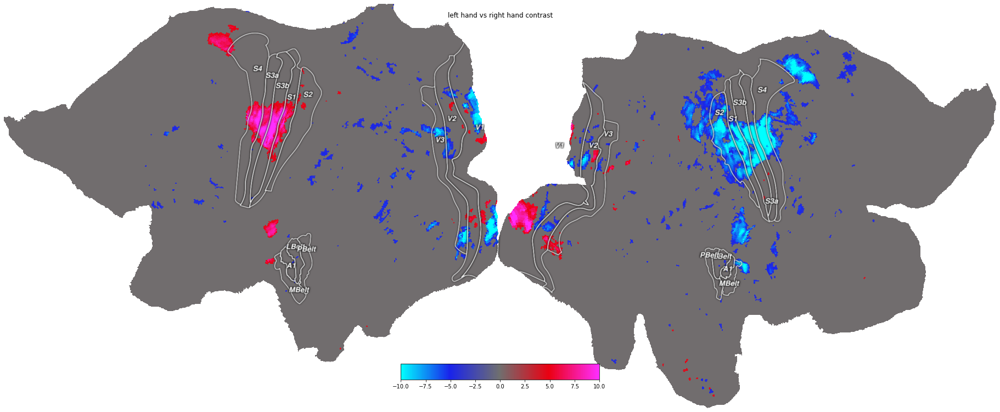

In [ ]:
rhands = np.array([1 if 'rhand' in uet else 0 for uet in unique_event_types]) # Construct contrast vector for hands
lhands = np.array([-1 if 'lhand' in uet else 0 for uet in unique_event_types])
contrast_vector = np.r_[0, rhands+lhands] # the intercept regressor was never in the event types list

c_betas = np.dot(contrast_vector, betas)

N = tseries_raw.shape[1]
P = betas.shape[0]
df = (N - P)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df
des_var = contrast_vector.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector.T)

t = c_betas / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4
t[np.abs(t) < 4] = t[np.abs(t) < 4]-t[np.abs(t) < 4]
# for i in range(100):
#   print(t[i])
f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left hand vs right hand contrast');

Right and left hand activation is visible in (approximately) the middle of the somatosensory region which is similar to the somatotopic map. The activation of the left hand is visible (blue) in the right hemisphere. While the activation of the right hand is visible(red) in the left hemisphere. This is also in line with the expectation that our body is represented contralaterally. 

Failed to get connection
** (inkscape:3216): CRITICAL **: 16:10:57.450: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3216): CRITICAL **: 16:10:57.450: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3216): CRITICAL **: 16:10:57.450: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


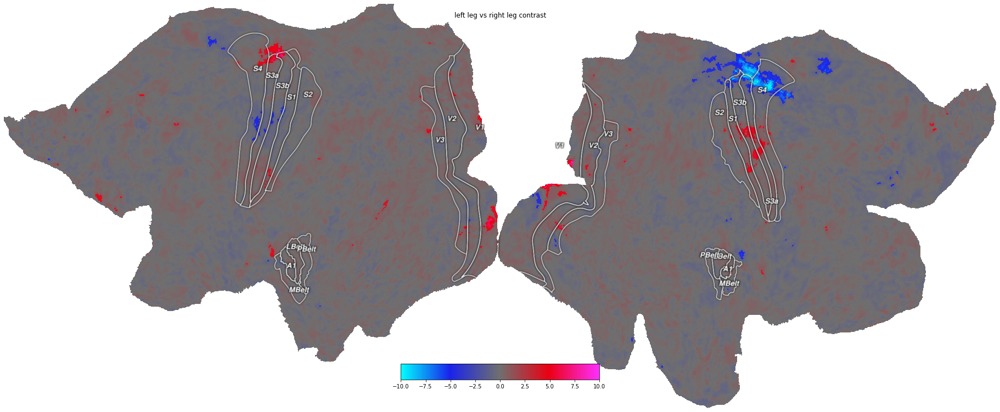

In [ ]:
#Leg contrast vector and map. Select the legs for the contrast vector.
rleg = np.array([1 if 'rleg' in uet else 0 for uet in unique_event_types])
lleg = np.array([-1 if 'lleg' in uet else 0 for uet in unique_event_types])
contrast_vector = np.r_[0, rleg+lleg] # the intercept regressor was never in the event types list

c_betas = np.dot(contrast_vector, betas)

N = tseries_raw.shape[1]
P = betas.shape[0]
df = (N - P)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df
des_var = contrast_vector.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector.T)

t = c_betas / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left leg vs right leg contrast');

We observe an activation at the top of the somatosensory region for both moving the left and right leg. Which is in line with the somatotopic map. Also the right leg activation is visible (red) at the top of the somatosensory region of the left hemisphere. While the left leg activation (blue) is visible at the top of the somatosensory region of the right hemisphere. But why do we see activation in the middle of the somatosensory region? 

**Question 2: Then, contrast the face vs an implicit baseline (an unbalanced contrast)** 
**Is the very coarse map of faces, hands, and feet we're seeing until now contiguous on the surface? Or are there some holes? If not, why do you think this is the case? Can you tie this back to the different regressors we have in our design?**

Failed to get connection
** (inkscape:3222): CRITICAL **: 16:11:02.123: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3222): CRITICAL **: 16:11:02.123: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3222): CRITICAL **: 16:11:02.123: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


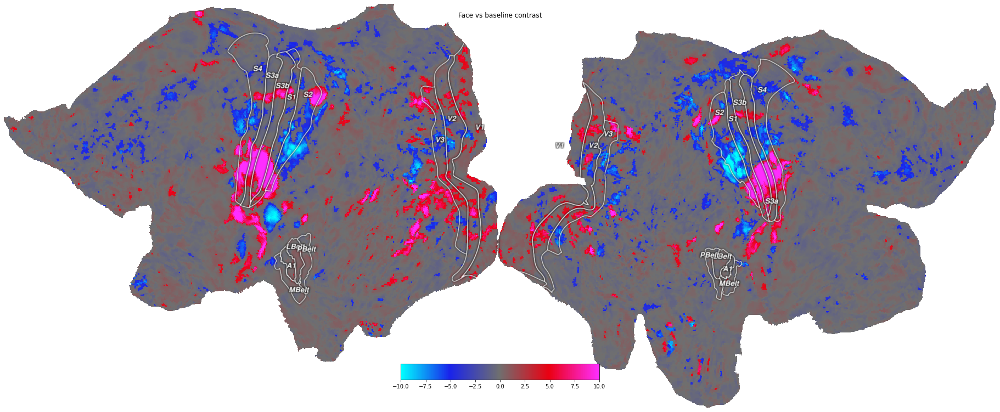

In [ ]:
contrast_vector_face = np.array([0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face

c_betas_face = np.dot(contrast_vector_face, betas)

N = tseries_raw.shape[1]
P = betas.shape[0]
df = (N - P)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df
des_var = contrast_vector_face.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_face.T)

t = c_betas_face / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('Face vs baseline contrast');

**Question 3: Now, subdivide the hand into its fingers, and test the left vs right contrast for each finger. For this analysis, create 5 separate flatmaps.**

17
Failed to get connection
** (inkscape:3226): CRITICAL **: 16:11:17.811: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3226): CRITICAL **: 16:11:17.811: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3226): CRITICAL **: 16:11:17.811: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


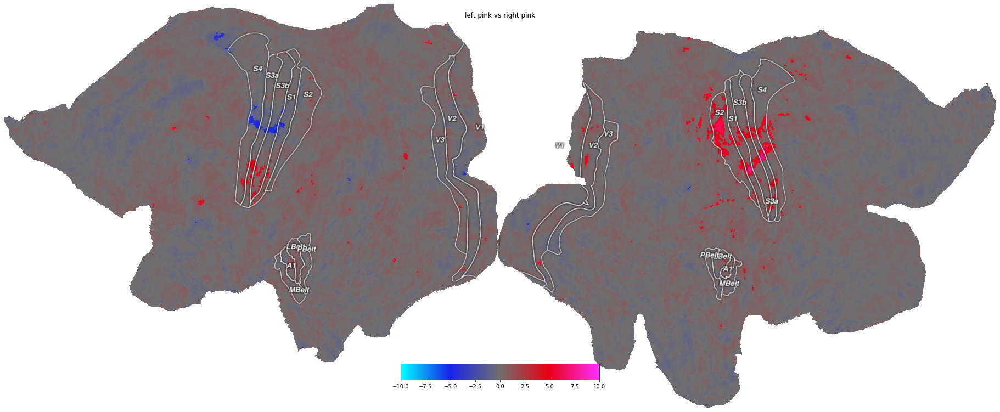

In [ ]:
contrast_vector_f1 = np.array([0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,-1,0]) # The contrast vector left pink vs right pink

c_betas_f1 = np.dot(contrast_vector_f1, betas)

N_f1 = tseries_raw.shape[1]
P_f1 = betas.shape[0]
df_f1 = (N_f1 - P_f1)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f1
des_var = contrast_vector_f1.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f1.T)

t = c_betas_f1 / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left pink vs right pink');

This means that the right hemisphere has activity for the left pink. However, the left hemisphere for some reason also shows activity for the left pink.

Failed to get connection
** (inkscape:3232): CRITICAL **: 16:11:22.341: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3232): CRITICAL **: 16:11:22.341: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3232): CRITICAL **: 16:11:22.341: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
** (inkscape:3232): CRITICAL **: 16:11:23.017: bool SPDocument::removeResource(const gchar*, SPObject*): assertion 'it != rlist.end()' failed


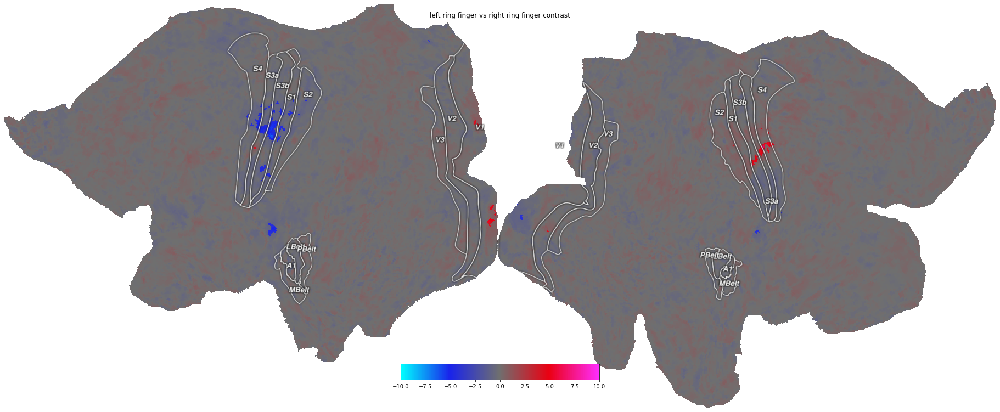

In [ ]:
#Ring finger
contrast_vector_f2 = np.array([0,0,0,0,0,0,1,0,0,0,0,0,0,0,-1,0,0])# The contrast vector for the ring fingers

c_betas_f2 = np.dot(contrast_vector_f2, betas)

N_f2 = tseries_raw.shape[1]
P_f2 = betas.shape[0]
df_f2 = (N_f2 - P_f2)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f2
des_var = contrast_vector_f2.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f2.T)

t = c_betas_f2 / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left ring finger vs right ring finger contrast');

In [ ]:
print(unique_event_types)

['eyebrows', 'eyes', 'mouth', 'tongue', 'lhand_fing1', 'lhand_fing2', 'lhand_fing3', 'lhand_fing4', 'lhand_fing5', 'lleg', 'rhand_fing1', 'rhand_fing2', 'rhand_fing3', 'rhand_fing4', 'rhand_fing5', 'rleg']


Failed to get connection
** (inkscape:3236): CRITICAL **: 16:11:26.923: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3236): CRITICAL **: 16:11:26.923: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3236): CRITICAL **: 16:11:26.923: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


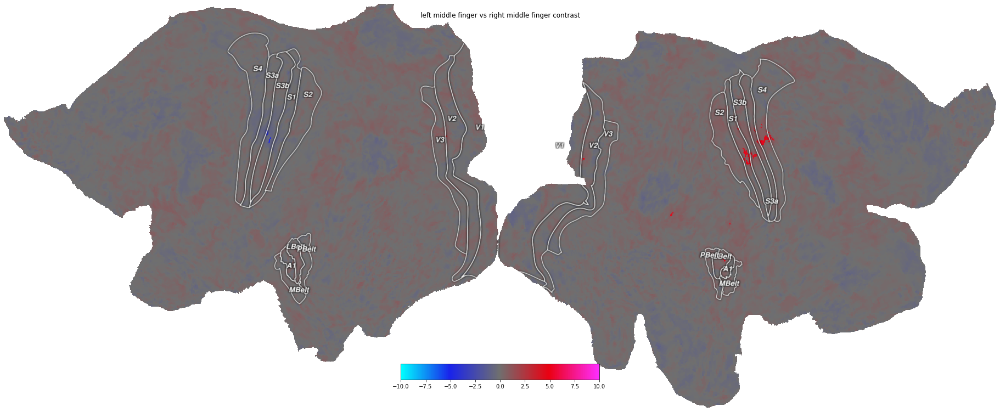

In [ ]:
# Middle finger

contrast_vector_f3 = np.array([0,0,0,0,0,0,0,1,0,0,0,0,0,-1,0,0,0]) # Select the event_types that were part of the face

c_betas_f3 = np.dot(contrast_vector_f3, betas)

N_f3 = tseries_raw.shape[1]
P_f3 = betas.shape[0]
df_f3 = (N_f3 - P_f3)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f3
des_var = contrast_vector_f3.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f3.T)

t = c_betas_f3 / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left middle finger vs right middle finger contrast');

Failed to get connection
** (inkscape:3242): CRITICAL **: 16:11:32.183: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3242): CRITICAL **: 16:11:32.184: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3242): CRITICAL **: 16:11:32.184: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


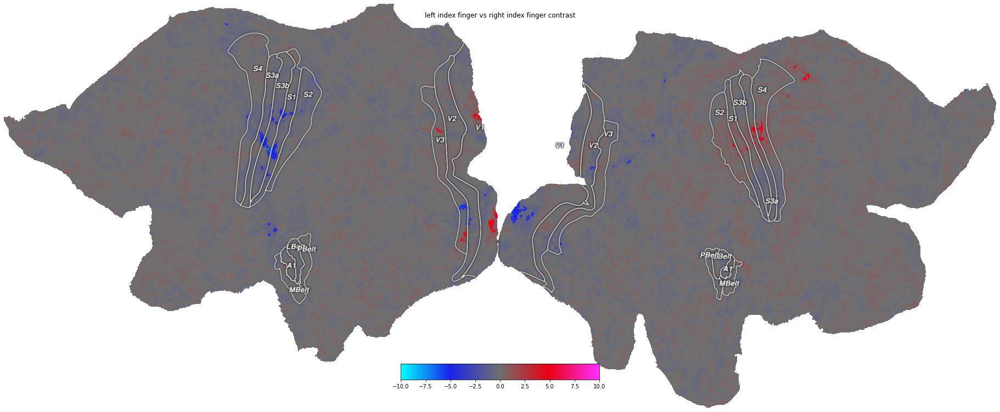

In [ ]:
# Index finger

contrast_vector_f4 = np.array([0,0,0,0,0,0,0,0,1,0,0,0,-1,0,0,0,0]) # Select the event_types that were part of the face

c_betas_f4 = np.dot(contrast_vector_f4, betas)

N_f4 = tseries_raw.shape[1]
P_f4 = betas.shape[0]
df_f4 = (N_f4 - P_f4)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f4
des_var = contrast_vector_f4.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f4.T)

t = c_betas_f4 / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left index finger vs right index finger contrast');

Failed to get connection
** (inkscape:3246): CRITICAL **: 16:11:37.218: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3246): CRITICAL **: 16:11:37.218: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3246): CRITICAL **: 16:11:37.218: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


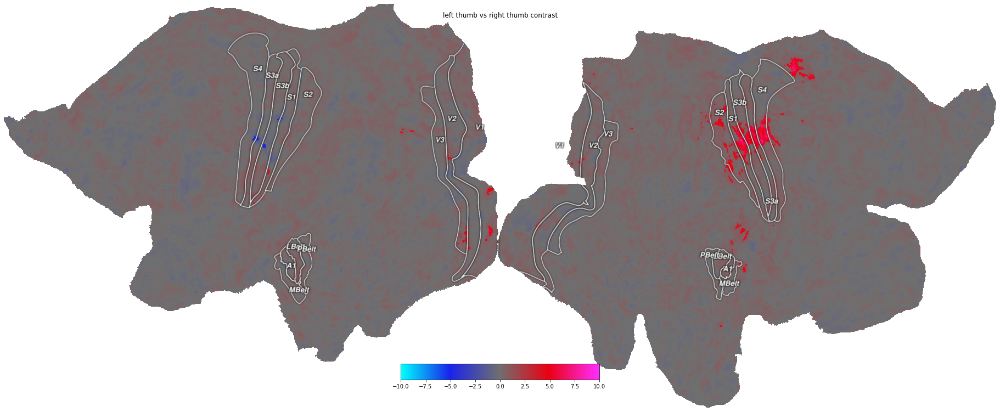

In [ ]:
# Thumb

contrast_vector_f5 =  np.array([0,0,0,0,0,0,0,0,0,1,0,-1,0,0,0,0,0]) # Select the event_types that were part of the face

c_betas_f5 = np.dot(contrast_vector_f5, betas)

N_f5 = tseries_raw.shape[1]
P_f5 = betas.shape[0]
df_f5 = (N_f5 - P_f5)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f5
des_var = contrast_vector_f5.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f5.T)

t = c_betas_f5 / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left thumb vs right thumb contrast');

4. 
But how are these ordered? Kind of hard to see now, with these separate figures. In the end, we want to create the actual somatotopic gradient on the surface! This is what we'll do. 
    - The first step is to figure out the winning finger for each voxel - use `np.argmax` for this. 
    - Now, re-code this such that you create a finger-line, running as follows: `[-5, -4, -3, -2, -1, 1, 2, 3, 4, 5]`. That is, from the left pinky to thumb and then from the right thumb to pinky. Set everything outside the hand regions you found in the previous analysis to `0` or `np.nan`. Now, visualize this using the `CyanBlueGrayRedPink`, `nipy_spectral`, or `J4` colormaps to bring about the finger maps on the surface. Or, if you come up with your own coloring, by all means go ahead! Is this map monotonic? In your report, you should relate these qualities of the map to the literature we gave you, and literature that you've discovered yourself.
    - In this experiment, subjects' movements would also have produced sensations. This means it's likely that you'll see these maps both in somatosensory AND motor cortex. In the Homunculus figure shown to the right here, there are slight differences between the two. Do your findings replicate this?

In [ ]:
#We wil make a contrast vector for every finger against baseline and acqurie the t-statistic. Based on these a winning finger will be chosen for every voxel
#Left pink
contrast_vector_f1_left = np.array([0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_f1_left = np.dot(contrast_vector_f1_left, betas)

N_f1_left = tseries_raw.shape[1]
P_f1_left = betas.shape[0]
df_f1_left = (N_f1_left - P_f1_left)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f1_left
des_var = contrast_vector_f1_left.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f1_left.T)

t_f1_left = c_betas_f1_left / np.sqrt(sigma_hat * des_var)
t_f1_left[np.abs(t_f1_left) < 4] = t_f1_left[np.abs(t_f1_left) < 4]/4


In [ ]:
#Left ring finger
contrast_vector_f2_left = np.array([0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_f2_left = np.dot(contrast_vector_f2_left, betas)

N_f2_left = tseries_raw.shape[1]
P_f2_left = betas.shape[0]
df_f2_left = (N_f2_left - P_f2_left)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f2_left
des_var = contrast_vector_f2_left.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f2_left.T)

t_f2_left = c_betas_f2_left / np.sqrt(sigma_hat * des_var)
t_f2_left[np.abs(t_f2_left) < 4] = t_f2_left[np.abs(t_f2_left) < 4]/4


[-0.20356444 -2.74874225  0.21493313 ... -0.21261773 -0.07357038
 -0.02962194]
[-0.05089111 -0.68718556  0.05373328 ... -0.05315443 -0.01839259
 -0.00740549]


In [ ]:
#left middle finger 
contrast_vector_f3_left = np.array([0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_f3_left = np.dot(contrast_vector_f3_left, betas)

N_f3_left = tseries_raw.shape[1]
P_f3_left = betas.shape[0]
df_f3_left = (N_f3_left - P_f3_left)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f3_left
des_var = contrast_vector_f3_left.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f3_left.T)

t_f3_left = c_betas_f3_left / np.sqrt(sigma_hat * des_var)
t_f3_left[np.abs(t_f3_left) < 4] = t_f3_left[np.abs(t_f3_left) < 4]/4

In [ ]:
#left index finger
contrast_vector_f4_left = np.array([0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_f4_left = np.dot(contrast_vector_f4_left, betas)

N_f4_left = tseries_raw.shape[1]
P_f4_left = betas.shape[0]
df_f4_left = (N_f4_left - P_f4_left)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f4_left
des_var = contrast_vector_f4_left.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f4_left.T)

t_f4_left = c_betas_f4_left / np.sqrt(sigma_hat * des_var)
t_f4_left[np.abs(t_f4_left) < 4] = t_f4_left[np.abs(t_f4_left) < 4]/4

In [ ]:
#left thumb
contrast_vector_f5_left = np.array([0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_f5_left = np.dot(contrast_vector_f5_left, betas)

N_f5_left = tseries_raw.shape[1]
P_f5_left = betas.shape[0]
df_f5_left = (N_f5_left - P_f5_left)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f5_left
des_var = contrast_vector_f5_left.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f5_left.T)

t_f5_left = c_betas_f5_left / np.sqrt(sigma_hat * des_var)
t_f5_left[np.abs(t_f5_left) < 4] = t_f5_left[np.abs(t_f5_left) < 4]/4

In [ ]:
#right thumb
contrast_vector_f1_right = np.array([0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_f1_right = np.dot(contrast_vector_f1_right, betas)

N_f1_right = tseries_raw.shape[1]
P_f1_right = betas.shape[0]
df_f1_right = (N_f1_right - P_f1_right)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f1_right
des_var = contrast_vector_f1_right.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f1_right.T)

t_f1_right = c_betas_f1_right / np.sqrt(sigma_hat * des_var)
t_f1_right[np.abs(t_f1_right) < 4] = t_f1_right[np.abs(t_f1_right) < 4]/4

In [ ]:
#right index finger
contrast_vector_f2_right = np.array([0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0]) # Select the event_types that were part of the face
c_betas_f2_right = np.dot(contrast_vector_f2_right, betas)

N_f2_right = tseries_raw.shape[1]
P_f2_right = betas.shape[0]
df_f2_right = (N_f2_right - P_f2_right)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f2_right
des_var = contrast_vector_f2_right.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f2_right.T)

t_f2_right = c_betas_f2_right / np.sqrt(sigma_hat * des_var)
t_f2_right[np.abs(t_f2_right) < 4] = t_f2_right[np.abs(t_f2_right) < 4]/4

In [ ]:
#right middle finger
contrast_vector_f3_right = np.array([0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0]) # Select the event_types that were part of the face
c_betas_f3_right = np.dot(contrast_vector_f3_right, betas)

N_f3_right = tseries_raw.shape[1]
P_f3_right = betas.shape[0]
df_f3_right = (N_f3_right - P_f3_right)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f3_right
des_var = contrast_vector_f3_right.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f3_right.T)

t_f3_right = c_betas_f3_right / np.sqrt(sigma_hat * des_var)
t_f3_right[np.abs(t_f3_right) < 4] = t_f3_right[np.abs(t_f3_right) < 4]/4

In [ ]:
#right ring finger
contrast_vector_f4_right = np.array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0]) # Select the event_types that were part of the face
c_betas_f4_right = np.dot(contrast_vector_f4_right, betas)

N_f4_right = tseries_raw.shape[1]
P_f4_right = betas.shape[0]
df_f4_right = (N_f4_right - P_f4_right)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f4_right
des_var = contrast_vector_f4_right.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f4_right.T)

t_f4_right = c_betas_f4_right / np.sqrt(sigma_hat * des_var)
t_f4_right[np.abs(t_f4_right) < 4] = t_f4_right[np.abs(t_f4_right) < 4]/4

In [ ]:
#right pinky
contrast_vector_f5_right = np.array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0]) # Select the event_types that were part of the face
c_betas_f5_right = np.dot(contrast_vector_f5_right, betas)

N_f5_right = tseries_raw.shape[1]
P_f5_right = betas.shape[0]
df_f5_right = (N_f5_right - P_f5_right)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_f5_right
des_var = contrast_vector_f5_right.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_f5_right.T)

t_f5_right = c_betas_f5_right / np.sqrt(sigma_hat * des_var)
t_f5_right[np.abs(t_f5_right) < 4] = t_f5_right[np.abs(t_f5_right) < 4]/4

In [ ]:
# Find the winning finger.
winning_finger = np.zeros(len(t_f2_left))

for i in range(len(winning_finger)):
  all_fingers_voxel = [abs(t_f1_left[i]), abs(t_f2_left[i]),abs(t_f3_left[i]),abs(t_f4_left[i]),abs(t_f5_left[i]),abs(t_f1_right[i]),abs(t_f2_right[i]),abs(t_f3_right[i]),abs(t_f4_right[i]),abs(t_f5_right[i])]

  if max(all_fingers_voxel) >= 4:
    if np.argmax(all_fingers_voxel) < 5:
      winning_finger[i] = np.argmax(all_fingers_voxel) - 5 #Change to -5
    else:
      winning_finger[i] = np.argmax(all_fingers_voxel) - 4 #Change to -5

  else:
    winning_finger[i] = 0

Failed to get connection
** (inkscape:3252): CRITICAL **: 16:11:44.311: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3252): CRITICAL **: 16:11:44.311: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3252): CRITICAL **: 16:11:44.311: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


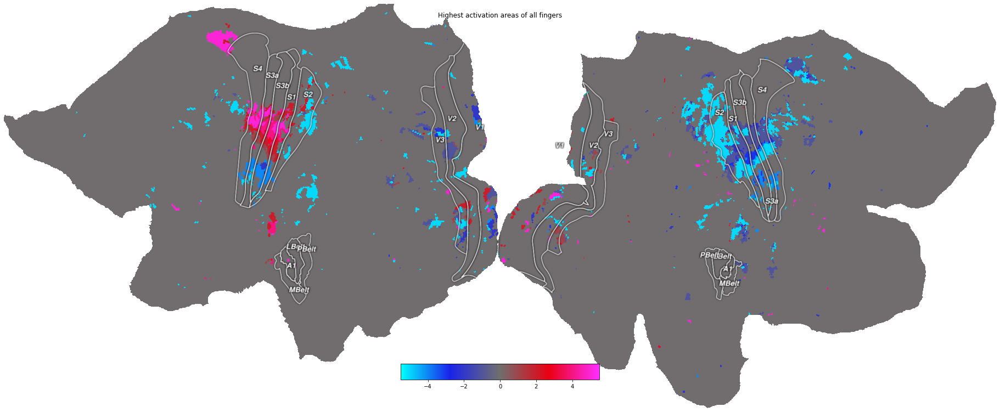

In [ ]:
gradient = cx.quickshow(cx.Vertex(winning_finger, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-5.5, vmax=5.5));
gradient.suptitle('Highest activation areas of all fingers');

Question 5 
Same process as for the fingers. Order from top to bottom of the face.

In [ ]:
#contrast vector eyebrows
contrast_vector_eyebrows = np.array([0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_eyebrows = np.dot(contrast_vector_eyebrows, betas)

N_eyebrows = tseries_raw.shape[1]
P_eyebrows = betas.shape[0]
df_eyebrows = (N_eyebrows - P_eyebrows)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_eyebrows
des_var = contrast_vector_eyebrows.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_eyebrows.T)

t_eyebrows = c_betas_eyebrows / np.sqrt(sigma_hat * des_var)
t_eyebrows[np.abs(t_eyebrows) < 4] = t_eyebrows[np.abs(t_eyebrows) < 4]/4

In [ ]:
#contrast vector eyes
contrast_vector_eyes = np.array([0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_eyes = np.dot(contrast_vector_eyes, betas)

N_eyes = tseries_raw.shape[1]
P_eyes = betas.shape[0]
df_eyes = (N_eyes - P_eyes)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_eyes
des_var = contrast_vector_eyes.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_eyes.T)

t_eyes = c_betas_eyes / np.sqrt(sigma_hat * des_var)
t_eyes[np.abs(t_eyes) < 4] = t_eyes[np.abs(t_eyes) < 4]/4

In [ ]:
#contrast vector mouth
contrast_vector_mouth = np.array([0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_mouth = np.dot(contrast_vector_mouth, betas)

N_mouth = tseries_raw.shape[1]
P_mouth = betas.shape[0]
df_mouth = (N_mouth - P_mouth)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_mouth
des_var = contrast_vector_mouth.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_mouth.T)

t_mouth = c_betas_mouth / np.sqrt(sigma_hat * des_var)
t_mouth[np.abs(t_mouth) < 4] = t_mouth[np.abs(t_mouth) < 4]/4

In [ ]:
#contrast vector tongue
contrast_vector_tongue = np.array([0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0]) # Select the event_types that were part of the face
c_betas_tongue = np.dot(contrast_vector_tongue, betas)

N_tongue = tseries_raw.shape[1]
P_tongue = betas.shape[0]
df_tongue = (N_tongue - P_tongue)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df_tongue
des_var = contrast_vector_tongue.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector_tongue.T)

t_tongue = c_betas_tongue / np.sqrt(sigma_hat * des_var)
t_tongue[np.abs(t_tongue) < 4] = t_tongue[np.abs(t_tongue) < 4]/4

4.0 0.0
Failed to get connection
** (inkscape:3272): CRITICAL **: 16:21:47.016: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3272): CRITICAL **: 16:21:47.016: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3272): CRITICAL **: 16:21:47.016: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


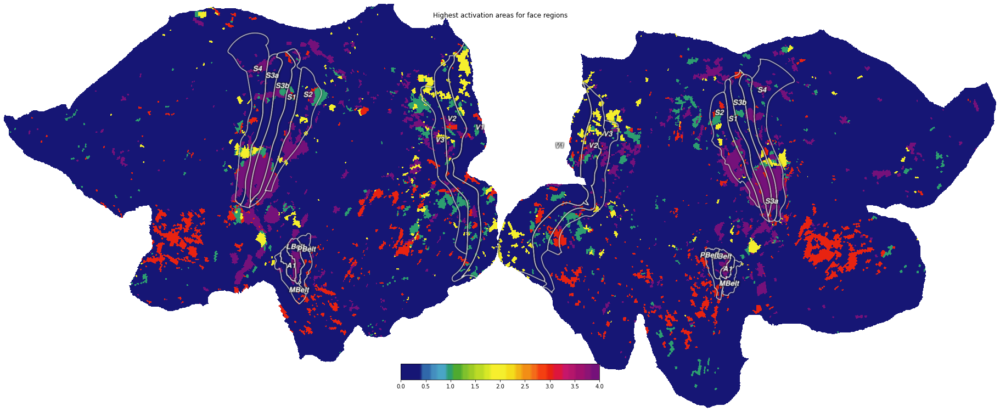

In [ ]:
whole_face = [t_eyebrows, t_eyes, t_mouth, t_tongue]
winning_face_area = np.zeros(len(t_eyebrows))

for i in range(len(winning_finger)):
  whole_face_voxel = [abs(t_eyebrows[i]), abs(t_eyes[i]),abs(t_mouth[i]),abs(t_tongue[i])]
  
  # print(max(all_fingers_voxel))
  if max(whole_face_voxel) >= 4:
    if np.argmax(whole_face_voxel) < 5:
      winning_face_area[i] = np.argmax(whole_face_voxel) +1 #Change to -5
    else:
      winning_face_area[i] = np.argmax(whole_face_voxel) + 1#Change to -5

  else:
    winning_face_area[i] = 0
gradient_face = cx.quickshow(cx.Vertex(winning_face_area, subject='hcp_999999', cmap='J4', vmin=0, vmax=4));
gradient_face.suptitle('Highest activation areas for face regions');


# Report Outline

This part of the notebook outlines the sections we expect your report to contain. You can use this part as a to-be-filled-in template for your project report. The total text should not be too long, so that you don't needlessly pain your long-suffering colleagues. Say, 2000 words max. 



# A journey of discovery: The somatotopic mapping of the brain
By Buelent Uendes, Koen van der Pool, Sophie Egter van Wissekerke and Afaan Muhammad


## Abstract

This study is an attempt to shed additional light on the functional organization of the primary motor cortex (M1) and parts of the somatosensory regions. By fitting a generalized linear model (GLM) to data obtained from an experiment in which subjects moved an avatar by using different body parts, this paper shows that somatosensory representations span more than 30% of the cortical surface in the contralateral hemisphere. Furthemore, the results suggest that lower limbs are spatially represented closer to the midline, whereas hands more laterally. The most ventral and lateral part of the cortex seems to be functionally linked to the face. These results are in line with previous findings and thereby highlight the fact that the brain has a mapping of different body regions.

## Introduction

The point-to-point mapping of a body part to a specific point in the central nervous system is known as somatotopy. In the 30’s and 50’s the somatotopic mapping in the human brain was already investigated by Penfield and his colleagues. Penfield defined the Homunculus, which is a visual representation of the mapping of body areas in the somatosensory cortex of the brain [1]. As it can be seen in Figure 1, each body part is represented in a certain location on the cortex. Lower extremities, such as legs, are located close to the midline. The arms and hands are represented in the lateral region of the cortex. The most lateral and ventral part of the brain represent the face [2]. Another significant finding of Penfield and his colleagues is that the representation of body parts on to the cortex is not proportional to the surface of the body part itself. Body parts such as the face and hands are overrepresented, while the trunk and legs are represented in far smaller cortical regions. The larger areas covered on the cortex represent body parts that are more sensitive. In other words, finely controlled body parts cover larger portions of the somatosensory cortex, whereas coarsely controlled areas (such as the trunk) cover a smaller portion [4].

<!-- <img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/Hj9spSs.png" alt="Homunculus" width="600" align="right" caption="Hallodefwfw"/> -->

<p class='image-right'><img src="https://i.imgur.com/Hj9spSs.png"><em>Figure 1 - The Penﬁeld Homunculus: a representation of the brain's somatosensory cortex mapping body space, with the size of the body signifying the size of the area of cortex devoted to it, and thus the sensitivity of that region.[3]</em></p>

The importance of being able to perform accurate and reliable whole-body somatosensory motor mapping should not be underestimated. Being able to accurately map the somatotopic organization in the human brain can be of great value for both basic research and medical purposes. A great understanding of how different body parts are represented in different areas of the brain will give a better understanding of the brain itself. Besides the importance in research and clinical purposes, topographic organization also appears to have computational advantages and it seems to be a general feature of organization in the brain. In addition, as is done in retinotopic mapping, somatotopic gradients can be used to define brain areas and their boundaries. Finally, it is important as a basis for further scientific research in such fields as plasticity and connectivity as well as for medical purposes (e.g., brain–machine interface applications, guiding Deep Brain Stimulation (DBS). Given the extent and importance of topographic organization, comprehensive mapping of the sensory-motor system can serve as a guide for a variety of future scientific and clinical explorations [5]. 
 
While the primary somatosensory cortex (S1) is functionally organized even on a ‘within limb’ level (see for example, [6]), it is unclear whether the same holds true for the primary motor cortex (M1). By using a population Receptive Field approach (pRF), Schellekens and his colleagues reveal that one can obtain a detailed somatotopic organization of the M1 [7].  This finding therefore suggests that not only the S1, but also the M1 is characterized by a detailed functional organization. 
 
The aim of this study is to further shed light on the functional organization of the M1. In particular, it addresses one of the limitations stated in [7] by extending the scope of the motor representation investigated. This is done by running an experimental paradigm that involves moving an avatar by not only one's finger, but also face and leg muscles respectively. 


## Materials and Methods 

**Participants and experimental paradigm**

In the experiment conducted, subjects watched a movie of an avatar moving its facial muscles, hands and legs in a quasi-cyclic order. To be able to identify differences across the different body parts and also across the different body sides (left and right), subjects were asked to move on some cycles both body parts, whereas on others participants were instructed to use only one. For each participant, a total of six identical cycles were run.

**Functional MRI image acquisition procedure**

The subjects were scanned in a Head First-Supine (HFS) position using a Philips 7T system. To acquire the functional magnetic resonance images (fMRI) the echo planar imaging (EPI) technique was used (voxel size, 0.3mm; TR = 1.6; TE = 0.022; flip angle, 65°; slice direction, z; slice order, ascending).

**Data, preprocessing and methodological approach**

The subsequent analysis uses experimental data of a single subject averaged across five runs. The data has been high-pass filtered to remove slow drifts and has also been converted to percent signal changes. As opposed to [6], this study applies a standard generalized linear model (GLM) to the blood oxygen level-dependent (BOLD) signal data. To obtain the regressors for each body part, a gamma difference function was convolved with an indicator function corresponding to the onset of a body movement. For the gamma function, an oversampling ratio of 16 was used and the subsequent regressors were normalized. To test the significance of the different body parts, standard t-tests were subsequently performed for each voxel (threshold: t > 4).

Further extensions to the methodological approach taken in this study are possible. First, one could prewhiten the data fitting a so-called autoregressive (AR) model to the residuals of the GLM model. Failing to account for autocorrelation, violates the standard Gauss Markov assumptions, thereby leading to inflated t-values. For this reason, a note of cautions needs to be added for the results presented in the following sections. To account for the multiple comparison problem arising from running various t-tests across the different voxels, one could consider applying the Benjamini-Hochberg procedure as proposed in [8]. Lastly, to investigate not only the peak, but also the width of the neural activation (BOLD responses are only an indirect derivative of neural activation) one could also fit a pRF model thereby resembling the approach taken in [7]. However, these extensions are left for future work, given the time constraints in this project. 




## Results

Multiple types of contrasts were considered for this study. The following section describes and discusses the most interesting findings.

First of all, the flatmaps showing contrasts between both hands and feet can be seen in Figure 2 and 3 respectively. Firstly, it can be seen that the activations in the right hemisphere, which correspond mostly to the left side of the body, encapsulate a bigger area in the respective hemisphere and show more significant activations according to the t-values. Secondly, it can be observed that hands and feet differ in their activation areas to some extent. The movements with the feet seem to cause activations in higher parts of S1-S4, while the hands are taking the lower parts.  Lastly, we find that the activation areas for the feet are much smaller compared to the activation areas for the hands.
 
When investigating the statistical significant areas of individual fingers across the two different hemispheres, the expected contralateral pattern emerges. However, this was not the case for the thumbs and the pinky fingers. Here, it was found that the areas in the right hemisphere resulted in more significant activations compared to their counterparts in the left hemisphere according to the fitted GLM model. 

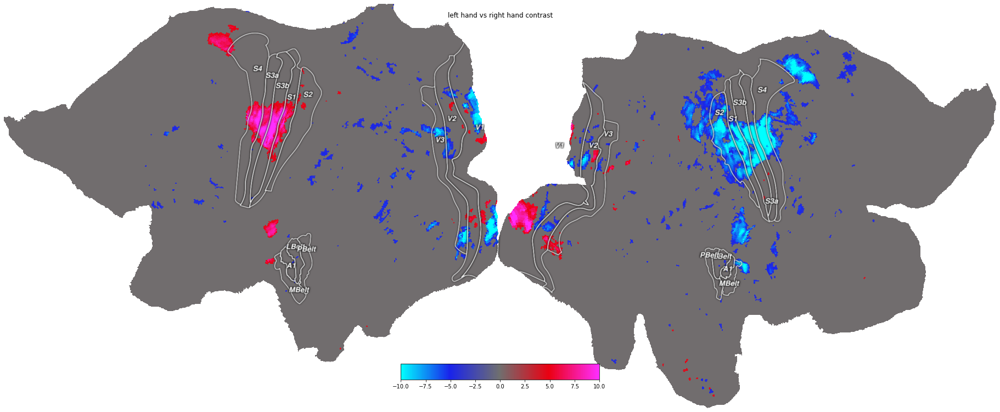
*Figure 2 - Contrast between the right and left hands based on the t-statistic (negative values represent left hand movements and positive values represents right hand movements)*

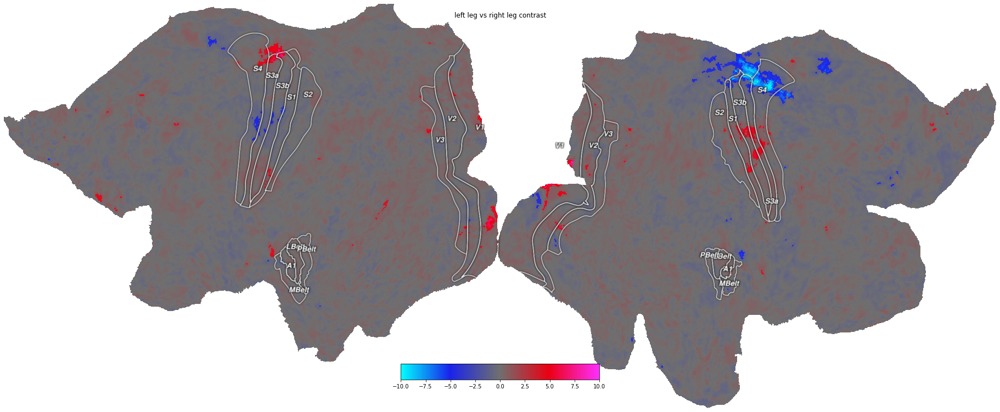
*Figure 3 - Contrast between the right and left feet based on the t-statistic (negative values represent left foot movements and positive values represents right foot movements)*

In Figure 4, the fingers are visually represented based on the highest t-value per voxel. It can be seen that a gradient is present to some extent. In the left hemisphere S1-S4 we see that the areas representing the outer left fingers (pinky and ring finger shown in light blue) go over into areas representing the inner fingers (middle finger, index finger and index finger, shown in dark blue). The area adjacent to these represents the right thumb (red), after which the area of the right pinky starts (pink) which encompasses the largest area. A similar (however less strong) gradient can be seen in the right hemisphere. 

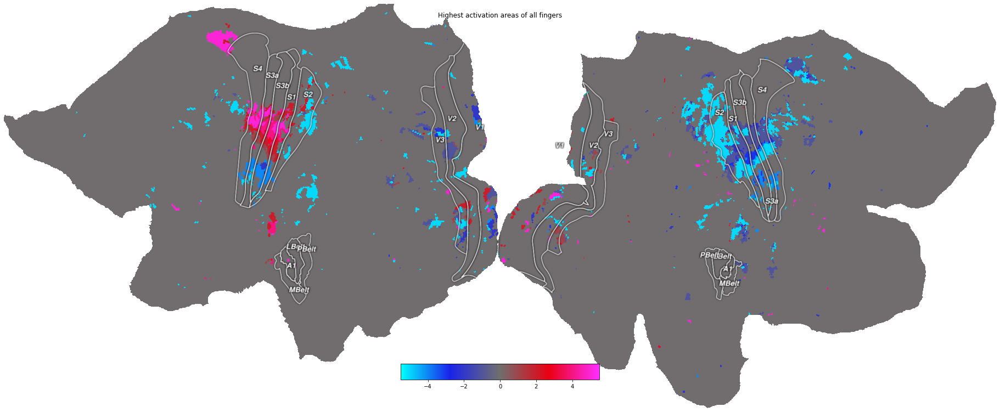
*Figure 4 - Ordering of finger areas in the brain based on highest t-value per voxel (negative values represent left finger movements with -5 for left pinky and -1 for left thumb. positive values represents right finger movements with 1 for right thumb and 5 for right pinky)*

When looking at  the highest activation per voxel based on the considered parts of the face (see Figure 5), almost no gradient can be observed and the activation areas are more scattered.

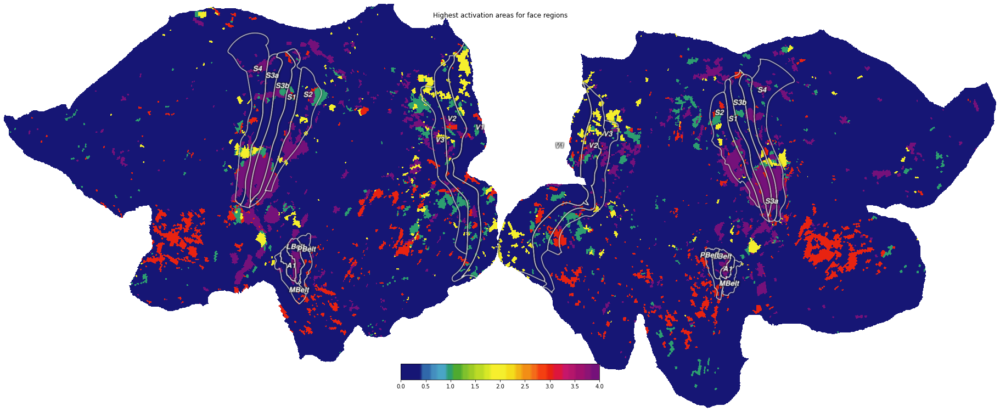
*Figure 5 - Ordering of different parts of the faces in the brain based on highest t-value per voxel (with 1, 2, 3 and 4 for eyebrows, eyes, mouth and tongue respectively)*

## Discussion
In this research paper, we have mostly focused on the functional organization of M1 and parts of the somatosensory regions. We have seen that the results are greatly in line with previous research [4, 5]. In [4, 5] they have also found that the lower limbs are represented close to the midline, hands are represented more laterally and the most ventral and lateral part of the cortex represents the face. Another finding that is in line with these studies, is that the somatosensory representation in the contralateral hemisphere spans more than 30% of the cortical surface. Besides looking at the somatotopic organization of body parts, the studies did look into the existence of the proportional differences in the Homunculus between cortical regions. For instance in study [4], they have found that the lower limb and lips are overrepresented while the upper limb and trunk has only a small representation. The small differences of proportional representations of different body parts in different cortical regions is difficult to observe in our study. Also, research papers [4,5] have focused on other regions outside of M1 and the somatosensory cortex, such as the temporal operculum which is part of the auditory cortex; these regions are not investigated or discussed in this research paper. 
 
During this research, we learned the importance of understanding your data and taking the necessary pre-processing steps. When these steps are followed correctly, the analysis yields interpretable and reproducable results. The benefits of the semi-standardization of the pre-processing steps together with the open software and -source culture in brain imaging research were also immediately apparent to us. Using simple code, complex analyzes can still be performed, which is essential for the development of this field of science. It should be noted here that all data must be supplied in the same format at all times and that knowledge of multiple disciplines (neurology, psychology, data science, etc.) is required to make the entire research a success: from data acquisition, to developing the pipeline till interpreting the images.
 
To get a more complete understanding of the somatotopic organization, future research should take more body parts into account. For example, for more detailed understanding of the organization of the face in the brain, one could add specific facial areas such as the cheeks. Finally, one could look into different experimental setups. For instance, in research [4], they have used touch as a stimulus while the experiment of Ines made use of an avatar on a screen. It is interesting to investigate whether the different experiments yield the same somatotopic organization on the cortex. 


## References

1.	Penfield, P. and Boldrey, E., 1937. Somatic motor and sensory representation in the cerebral cortex of man as studied by electrical stimulation.  Brain. 60, 389-443. 
2.   	 K. B., Arpin, D. J., Vaillancourt, D. E., Fang, R., Coombes, S. A., 2021. Unraveling
somatotopic organization in the human brain using machine learning and adaptive
supervoxel-based parcellations. NeuroImage. 245. 
3.  	Proulx, M. J., Todorov, O. S., Taylor Aiken, A., de Sousa, A. A., 2016. Where am I? Who am I? The Relation Between Spatial Cognition, Social Cognition and Individual
Differences in the Built Environment. Frontiers in Psychology. 7, 8-10. 
4.  	Saadon-Grosman, N., Loewenstein, Y., Arzy, S., 2020. The ‘creatures’ of the human cortical somatosensory system. Brain communications. 2. 
5.    	Zeharia, N., Hertz, U., Flash, T., Amedi, A., 2015. New whole-body sensory-motor
gradients revealed using phase-locked analysis and verified using multivoxel pattern analysis and functional connectivity. Journal of Neuroscience. 35, 2845-2859.
6. 	Kolasinski, J., Makin, T.R., Jbabdi, S., Clare, S. Stagg, C.J., Johansen-Berg, H., 2016. Investigating the stability of fine-grain digit somatotopy in individual human participants. J. Neurosci. 36, 1113-1127.
7.   	Schellekens, W., Petridou, N., Ramsey, Nick F., 2018. Detailed somatotopy in primary motor and somatosensory cortex revealed by Gaussian population receptive fields. NeuroImage. 179, 337-347.
8.  	Benjamini, Y., Hochberg, Y., 1995. Controlling the False Discovery Rate: A Practical and Powerful Approach to Multiple Testing. Journal of the Royal Statistical Society. Series B (Methodological). Vol. 57, No.1, 289-300. 